In [25]:
#Cài đặt thư viện
%pip install imageio
%pip install spicy 
%pip install scikit-image

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [26]:
#2.1: nạp ảnh sử dụng thư viện Python Image Library (PLL)

%pip install matplotlib
from PIL import Image
import numpy as np 
img = Image.open('bird.png')
img.show()

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


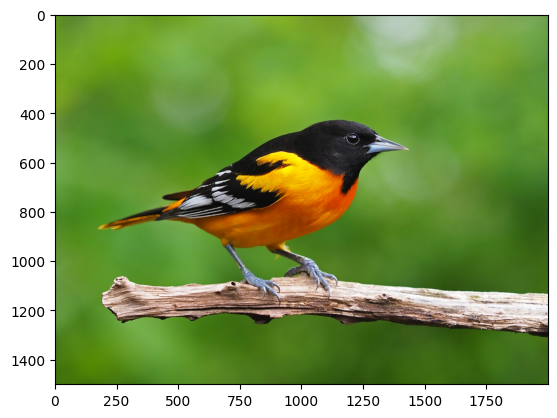

In [27]:
#2.2: Nạp ảnh sử dụng lệnh thư viện imageio
import numpy as np 
import imageio.v2 as iio
import matplotlib.pylab as plt

data = iio.imread('bird.png')
plt.imshow(data)
plt.show()

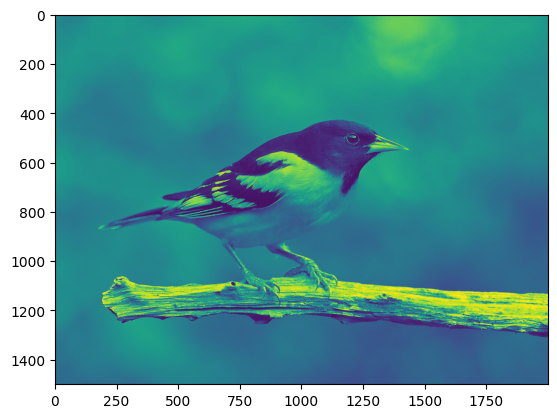

In [28]:
#2.3: Đọ phân giải ảnh
import numpy as np 
import imageio.v2 as iio
import matplotlib.pylab as plt

data = iio.imread('bird.png',mode='F')
plt.imshow(data)
plt.show()

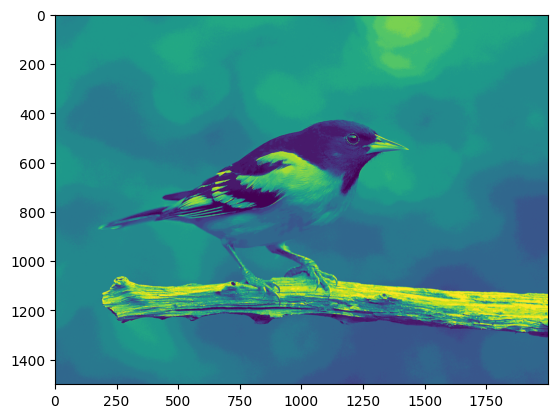

In [29]:
#2.3.1
import numpy as np 
import imageio.v2 as iio
import matplotlib.pylab as plt

data = iio.imread('bird.png',mode='F').astype(np.uint8)
cl= data & 0xF0
iio.imsave('birdf0.png', cl )
tmp= iio.imread('birdf0.png')
plt.imshow(tmp)
plt.show()

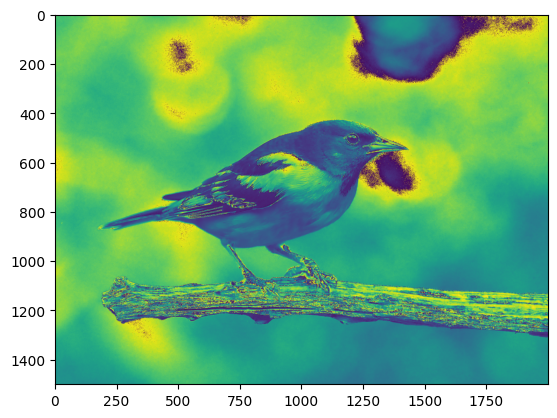

In [30]:
#2.4: Màu sắc với hệ RGB
import numpy as np 
import imageio.v2 as iio
import matplotlib.pylab as plt

data = iio.imread('bird.png')
bdata= (data[:,:,1]+data[:,:,2])
plt.imshow(bdata)
plt.show()

In [31]:
#2.5:Màu sắc với hệ HSV
import numpy as np 
import imageio.v2 as iio
import matplotlib.pylab as plt
import colorsys

a=colorsys.rgb_to_hsv(255,0,0)
print(a)
b=colorsys.rgb_to_hsv(1,0,0)
print(b)
c=colorsys.rgb_to_hsv(0,255,0)
print(c)
d=colorsys.rgb_to_hsv(1,1,255)
print(d)

(0.0, 1.0, 255)
(0.0, 1.0, 1)
(0.3333333333333333, 1.0, 255)
(0.6666666666666666, 0.996078431372549, 255)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


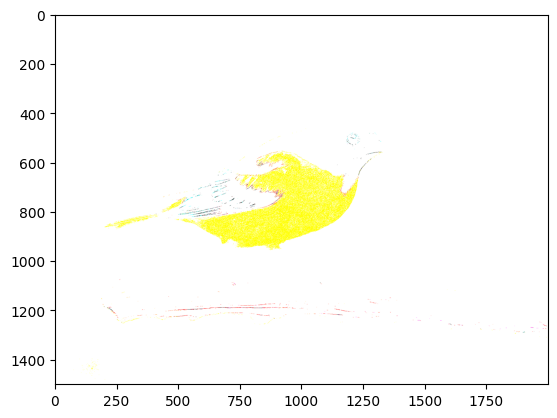

In [32]:
#2.6: Ứng dụng chuyển đổi hệ màu
import numpy as np 
import imageio.v2 as iio
import matplotlib.pylab as plt
import colorsys

rgb= data = iio.imread('bird.png')
rgb2hsv= np.vectorize(colorsys.rgb_to_hsv)
h,s,v= rgb2hsv(rgb[:,:,0],rgb[:,:,1],rgb[:,:,2])
h*=h 
hsv2rgb=np.vectorize(colorsys.hsv_to_rgb)
rgb2= hsv2rgb(h,s,v)
rgb2= np.array(rgb2).transpose((1,2,0))
plt.imshow(rgb2)
plt.show()

[[119 119 119 ... 132 131 131]
 [119 119 119 ... 131 131 131]
 [120 120 119 ... 132 132 131]
 ...
 [ 89  89  89 ...  80  80  80]
 [ 89  89  89 ...  80  80  80]
 [ 90  89  89 ...  80  80  80]]


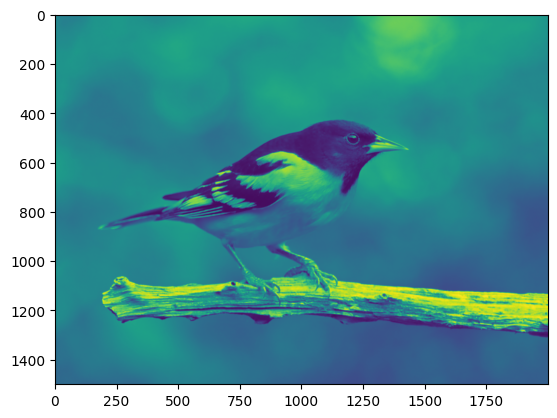

In [8]:
#2.7:Lọc ảnh
#2.7.1: lọc ảnh với mean filter

import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
import matplotlib.pylab as plt
import colorsys

# opening the image and converting it to grayscale
a = iio.imread('bird.png', mode='F')

# initializing the filter of size 5 by 5
# the filter is divided by 25 for normalization
k = np.ones((5,5)) / 25

# performing convolution
b = sn.convolve(a, k).astype(np.uint8)
iio.imsave('bird_mean_filter.png', b)

# b is converted from an ndarray to an image
print(b)
plt.imshow(b)
plt.show()



[[118 118 118 ... 131 131 131]
 [118 118 119 ... 131 131 131]
 [119 119 119 ... 132 131 131]
 ...
 [ 89  88  88 ...  81  81  81]
 [ 89  88  88 ...  80  81  81]
 [ 89  88  89 ...  80  80  81]]


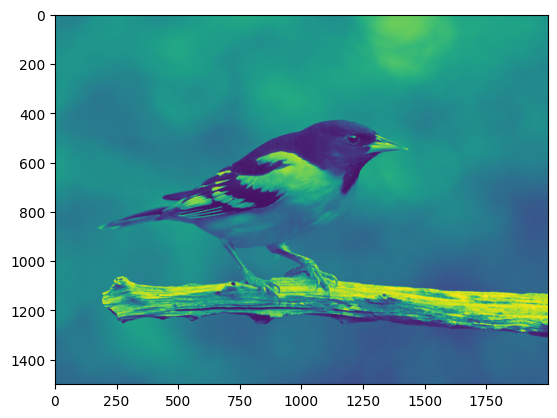

In [34]:
#2.7.2:lọc ảnh với median filter
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
import matplotlib.pylab as plt
import colorsys

# opening the image and converting it to grayscale
a = iio.imread('bird.png', mode='F').astype(np.uint8)

# performing median filter
# size = 5: convolution
## footprint: a boolean array of the same dimension of image.
## The pixels in the input image corresponding to the points to the
## footprint with true values are considered for filtering
## mode: padding (constant, reflect, nearest)
b = sn.median_filter(a, size=5, footprint=None, output=None,
                     mode='reflect', cval=0.0, origin=0)

iio.imsave('bird_median_filter.png', b)

# b is converted from an ndarray to an image
print(b)
plt.imshow(b)
plt.show()


[[121 121 121 ... 138 138 138]
 [128 128 128 ... 138 138 138]
 [128 128 128 ... 138 138 138]
 ...
 [ 96  96  96 ...  83  83  83]
 [ 96  96  96 ...  83  83  83]
 [ 96  96  96 ...  83  83  83]]


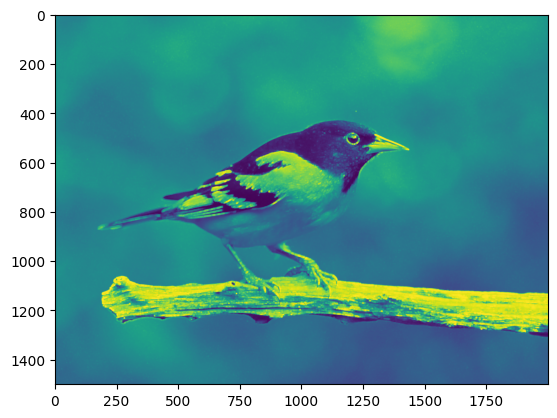

In [35]:
#2.7.3:lọc ảnh bằng Max filter
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
import matplotlib.pylab as plt
import colorsys

# opening the image and converting it to grayscale
a = iio.imread('bird.png', mode='F').astype(np.uint8)

# performing maximum filter
## size = 5: convolution
## footprint: a boolean array of the same dimension of image.
## The pixels in the input image corresponding to the points to the
## footprint with true values are considered for filtering
## mode: padding (constant, reflect, nearest)
b = sn.maximum_filter(a, size=5, footprint=None, output=None,
                      mode='reflect', cval=0.0, origin=0)

iio.imsave('bird_max_filter.png', b)

# b is converted from an ndarray to an image
print(b)
plt.imshow(b)
plt.show()



[[117 117 117 ... 127 127 127]
 [113 113 113 ... 127 127 127]
 [113 113 113 ... 127 127 127]
 ...
 [ 85  85  85 ...  76  76  76]
 [ 85  85  85 ...  76  76  76]
 [ 85  85  85 ...  78  78  78]]


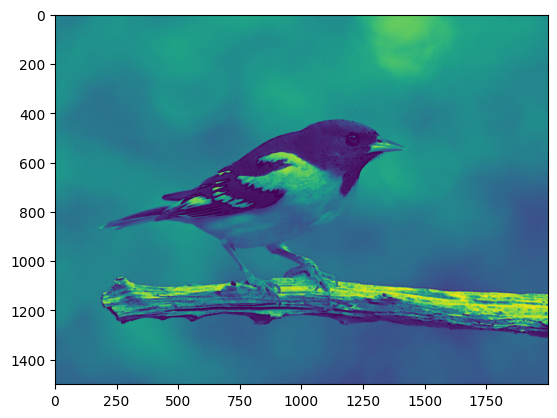

In [ ]:
#2.7.4:lọc ảnh bằng Min filter

import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
import matplotlib.pylab as plt
import colorsys

# opening the image and converting it to grayscale
a = iio.imread('bird.png', mode='F').astype(np.uint8)

# performing maximum filter
## size = 5: convolution
## footprint: a boolean array of the same dimension of image.
## The pixels in the input image corresponding to the points to the
## footprint with true values are considered for filtering
## mode: padding (constant, reflect, nearest)
b = sn.minimum_filter(a, size=5, footprint=None, output=None,
                      mode='reflect', cval=0.0, origin=0)
iio.imsave('bird_min_filter.png', b)

# b is converted from an ndarray to an image
print(b)
plt.imshow(b)
plt.show()


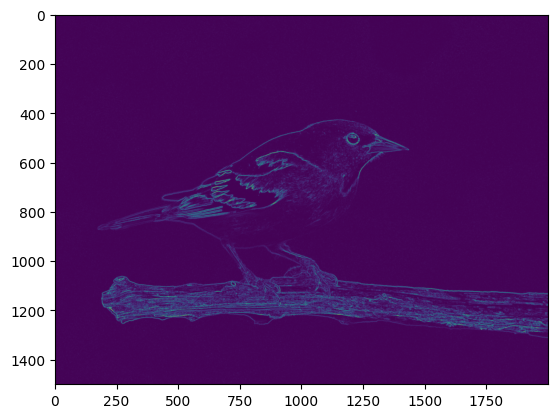

In [37]:
#2.8:Dò cạnh biên của ảnh
#TH1: Xác định biên của đối tượng trên frist derivative sử dụng Sobel filer
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sm
from skimage import filters
import matplotlib.pyplot as plt
import colorsys

# Opening the image and converting it to grayscale
a = iio.imread('bird.png', mode='F')
b = filters.sobel(a).astype(np.uint8)

iio.imwrite('bird_sobel_filter_edge_detection.png', b)
plt.imshow(b)
plt.show()



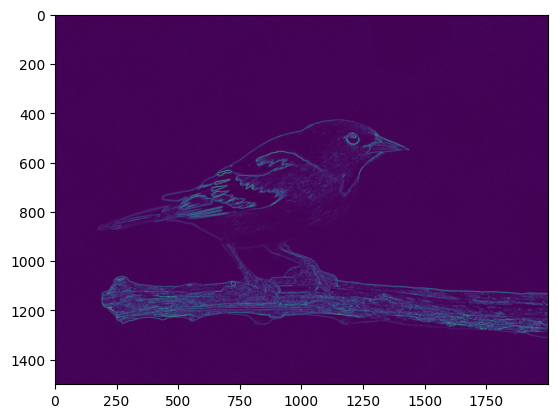

In [38]:
#TH02: Xác định biên của đối tượng trên frist derivative sử dụng Prewitt filter
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sm
from skimage import filters
import matplotlib.pyplot as plt
import colorsys

# Opening the image and converting it to grayscale
a = iio.imread('bird.png', mode='F')
b = filters.prewitt(a).astype(np.uint8)

iio.imwrite('bird_prewitt_filter_edge_detection.png', b)
plt.imshow(b)
plt.show()


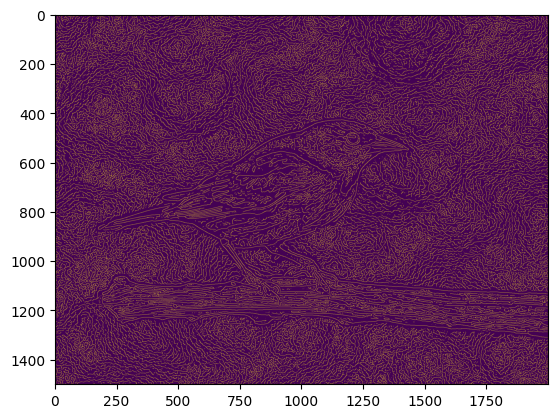

In [39]:
#TH03: Xác định biên của đối tượng trên frist derivative sử dụng Canny filter
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sm
from skimage import feature
import matplotlib.pyplot as plt
import colorsys

# Opening the image and converting it to grayscale
a = iio.imread('bird.png', mode='F')
b = feature.canny(a, sigma=3).astype(np.uint8)

iio.imwrite('bird_canny_filter_edge_detection.png', b)
plt.imshow(b)
plt.show()
    

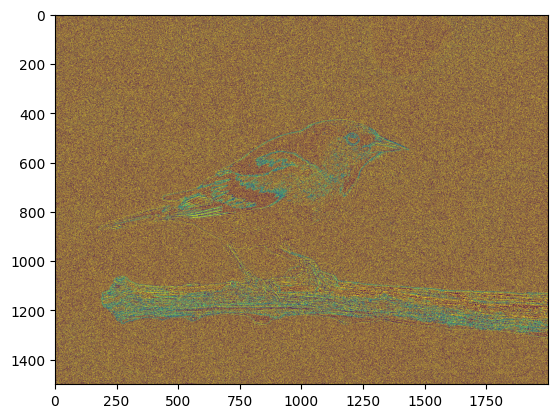

In [40]:
#TH04: Xác định biên của đối tượng sử dụng Second derivative

import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
from skimage import filters
import matplotlib.pyplot as plt
import colorsys

# Opening the image and converting it to grayscale
a = iio.imread('bird.png', mode='F')
b = sn.laplace(a, mode='reflect').astype(np.uint8)

iio.imwrite('bird_laplace_filter_edge_detection.png', b)
plt.imshow(b)
plt.show()


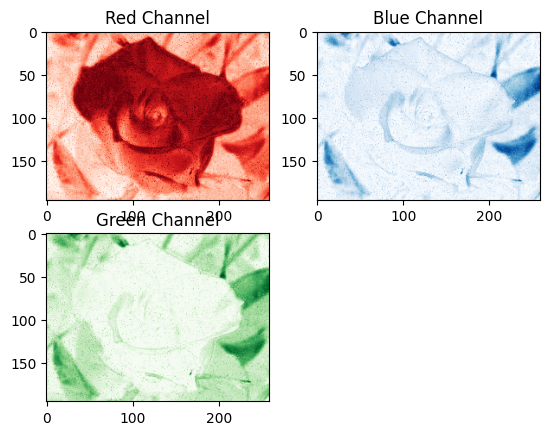

(195, 259, 3)


In [23]:
#3: Bài tập
#Bài 1:

import imageio.v3 as iio
import matplotlib.pyplot as plt

data = iio.imread('exercise/flower.jpeg')

plt.subplot(2, 2, 1)
plt.title("Red Channel")
plt.imshow(data[:, :, 0], cmap='Reds')

plt.subplot(2, 2, 2)
plt.title("Blue Channel")
plt.imshow(data[:, :, 2], cmap='Blues')

plt.subplot(2, 2, 3)
plt.title("Green Channel")
plt.imshow(data[:, :, 1], cmap='Greens')

plt.show()

print(data.shape)



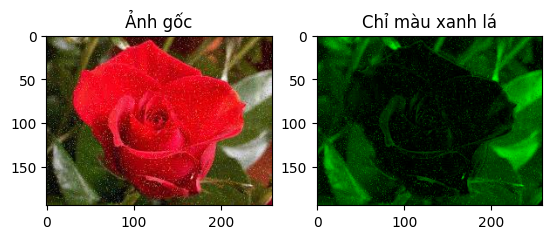

Đã lưu ảnh chỉ có màu xanh lá: exercise/flower_green.jpeg


In [29]:
#Bài 2:
import imageio.v3 as iio
import matplotlib.pyplot as plt
import numpy as np

# Đọc ảnh gốc
image = iio.imread('exercise/flower.jpeg')

# Tạo ảnh chỉ có màu xanh lá (Green)
green_image = np.zeros_like(image)
green_image[:, :, 1] = image[:, :, 1]  # Giữ lại kênh G

# Hiển thị ảnh gốc và ảnh xanh lá
plt.subplot(1, 2, 1)
plt.title("Ảnh gốc")
plt.imshow(image)

plt.subplot(1, 2, 2)
plt.title("Chỉ màu xanh lá")
plt.imshow(green_image)

plt.show()

# Lưu ảnh
iio.imwrite('exercise/flower_green.jpeg', green_image)
print("Đã lưu ảnh chỉ có màu xanh lá: exercise/flower_green.jpeg")





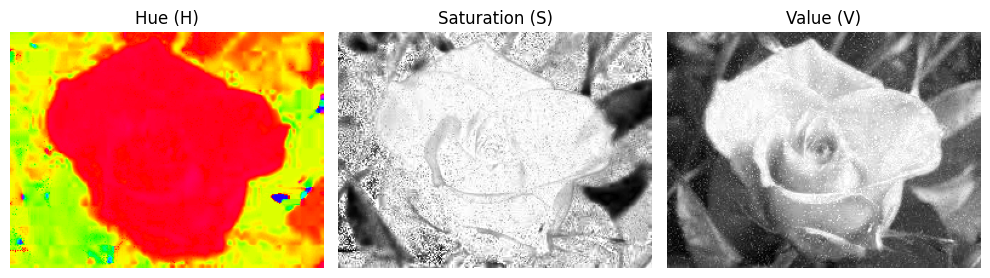

In [1]:
#Bài 3:
import imageio.v3 as iio
import matplotlib.pyplot as plt

# Đọc lại 3 ảnh kênh HSV đã lưu
hue = iio.imread('exercise/hue.png')
sat = iio.imread('exercise/sat.png')
val = iio.imread('exercise/val.png')

# Hiển thị
plt.figure(figsize=(10, 4))

plt.subplot(1, 3, 1)
plt.title("Hue (H)")
plt.imshow(hue, cmap='hsv')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Saturation (S)")
plt.imshow(sat, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Value (V)")
plt.imshow(val, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()



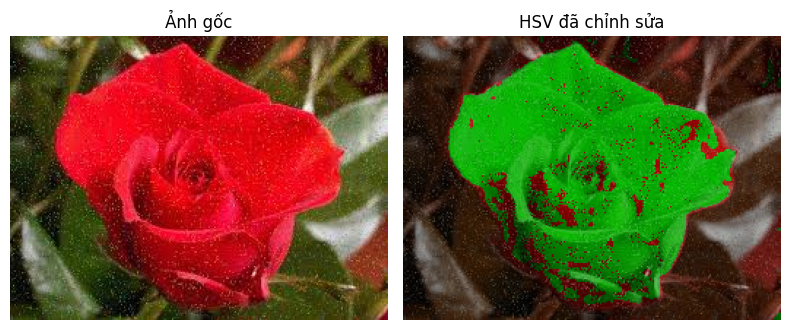

In [39]:
#Bài 4:
import imageio.v3 as iio
import numpy as np
import colorsys
import matplotlib.pyplot as plt

# Bước 1: Đọc ảnh và chuẩn hóa giá trị RGB về [0, 1]
img = iio.imread('exercise/flower.jpeg')
r = img[:, :, 0] / 255.0
g = img[:, :, 1] / 255.0
b = img[:, :, 2] / 255.0

# Bước 2: Chuyển từ RGB sang HSV
rgb2hsv = np.vectorize(colorsys.rgb_to_hsv)
h, s, v = rgb2hsv(r, g, b)

# Bước 3: Thay đổi H và V theo yêu cầu
h = h / 3.0      # H_new = 1/3 * H_old
v = v * 0.75     # V_new = 3/4 * V_old

# Đảm bảo H không vượt quá 1
h = np.mod(h, 1.0)

# Bước 4: Chuyển từ HSV quay lại RGB
hsv2rgb = np.vectorize(colorsys.hsv_to_rgb)
r_new, g_new, b_new = hsv2rgb(h, s, v)

# Bước 5: Kết hợp và chuyển về uint8
rgb_new = np.dstack((r_new, g_new, b_new)) * 255
rgb_new = rgb_new.astype(np.uint8)

# Bước 6: Lưu ảnh đã chỉnh sửa
iio.imwrite('exercise/hsv_modified.png', rgb_new)

# (Tuỳ chọn) Hiển thị ảnh gốc và ảnh mới
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.title("Ảnh gốc")
plt.imshow(img)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("HSV đã chỉnh sửa")
plt.imshow(rgb_new)
plt.axis('off')

plt.tight_layout()
plt.show()


✅ Đã lưu: exercise/mean_baby.jpeg


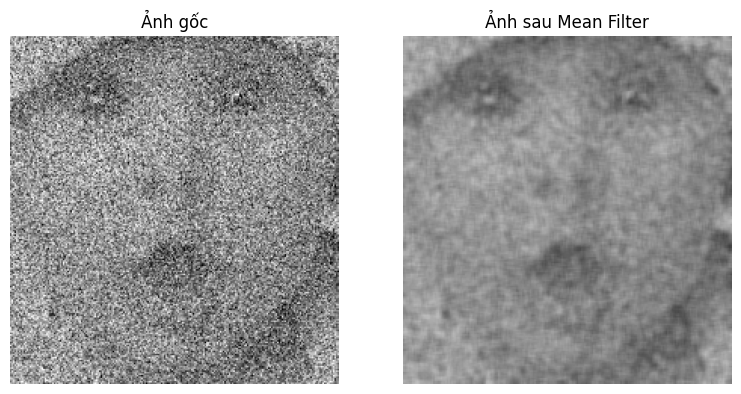

✅ Đã lưu: exercise/mean_balloons_noisy.png


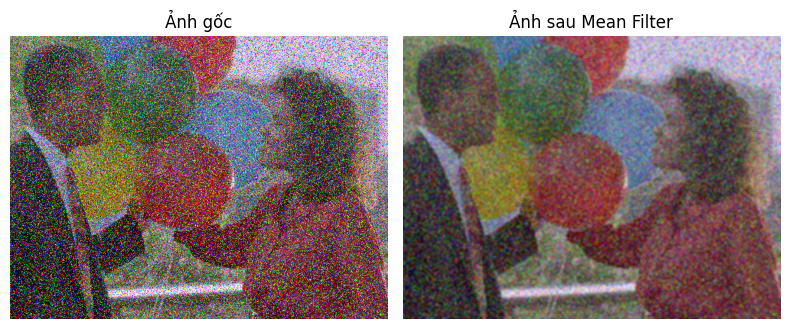

✅ Đã lưu: exercise/mean_flower.jpeg


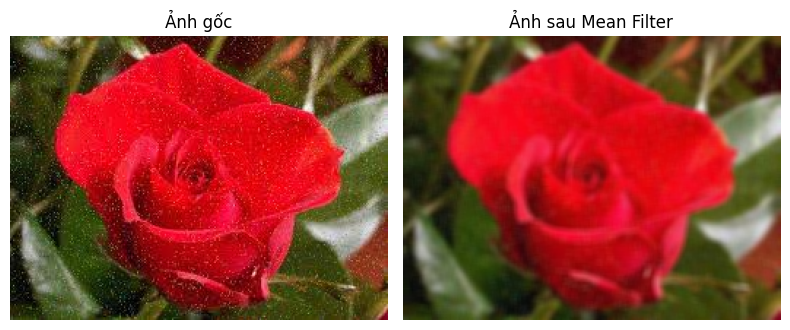

In [14]:
#Bài 5:
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
import matplotlib.pyplot as plt

# Danh sách tên ảnh cần xử lý
image_files = ['exercise/baby.jpeg', 'exercise/balloons_noisy.png', 'exercise/flower.jpeg']

# Tạo kernel mean 5x5
mean_kernel = np.ones((5, 5)) / 25

# Duyệt qua từng ảnh
for path in image_files:
    # Đọc ảnh màu
    original = iio.imread(path)

    # Lọc từng kênh màu riêng biệt
    filtered = np.zeros_like(original)
    for c in range(3):  # 0: Red, 1: Green, 2: Blue
        filtered[:, :, c] = sn.convolve(original[:, :, c], mean_kernel).astype(np.uint8)

    # Tạo tên ảnh đã lọc
    output_path = path.replace('exercise/', 'exercise/mean_')

    # Lưu ảnh đã lọc
    iio.imwrite(output_path, filtered)
    print(f"✅ Đã lưu: {output_path}")

    # Hiển thị ảnh gốc và ảnh đã lọc
    plt.figure(figsize=(8, 4))

    plt.subplot(1, 2, 1)
    plt.title("Ảnh gốc")
    plt.imshow(original)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Ảnh sau Mean Filter")
    plt.imshow(filtered)
    plt.axis('off')

    plt.tight_layout()
    plt.show()


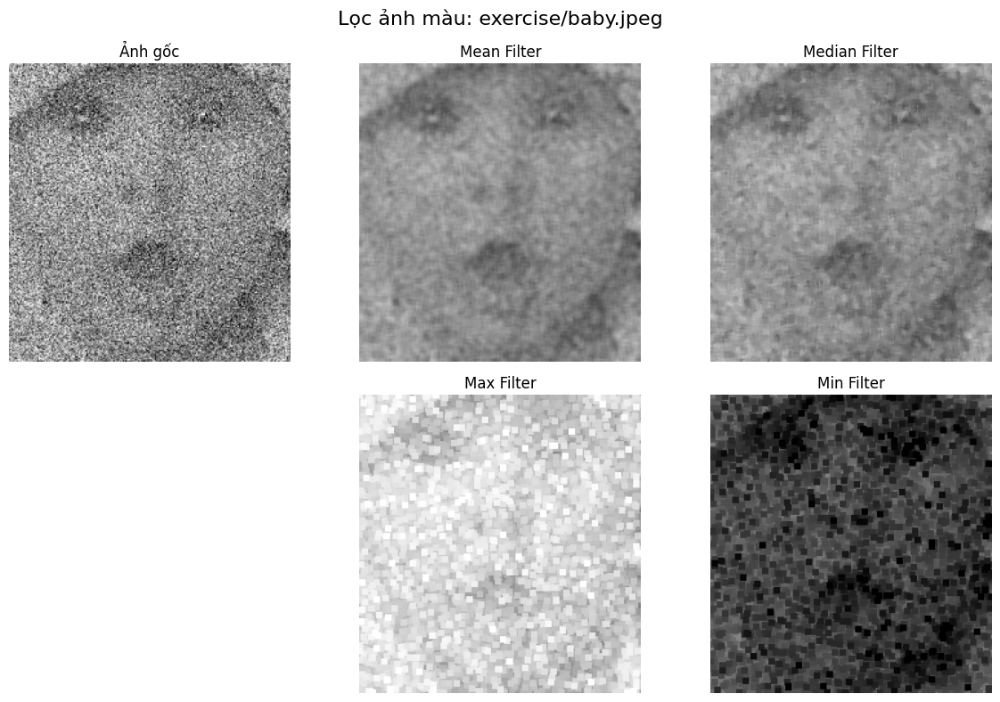

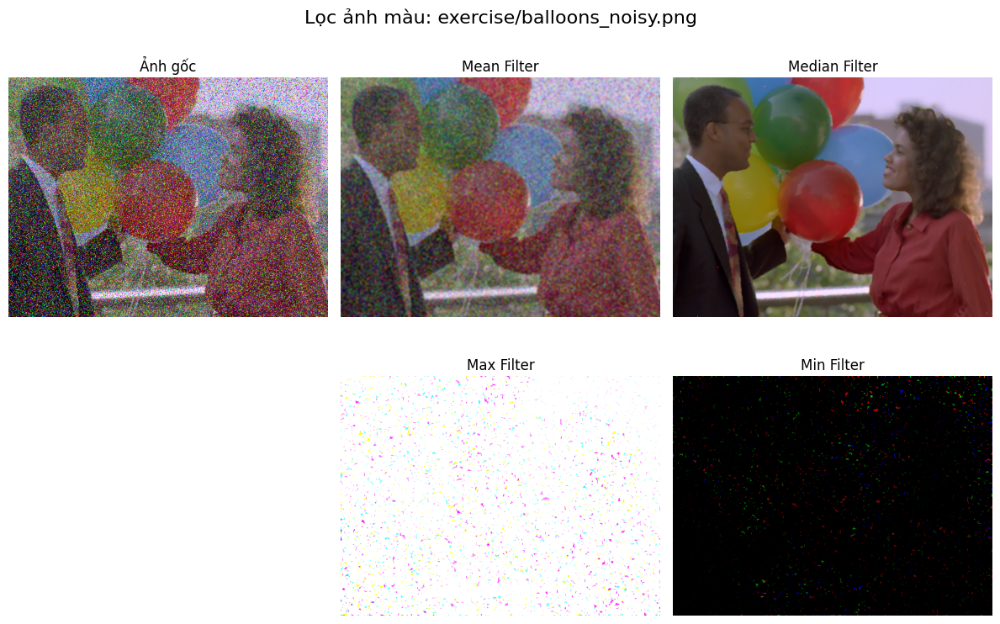

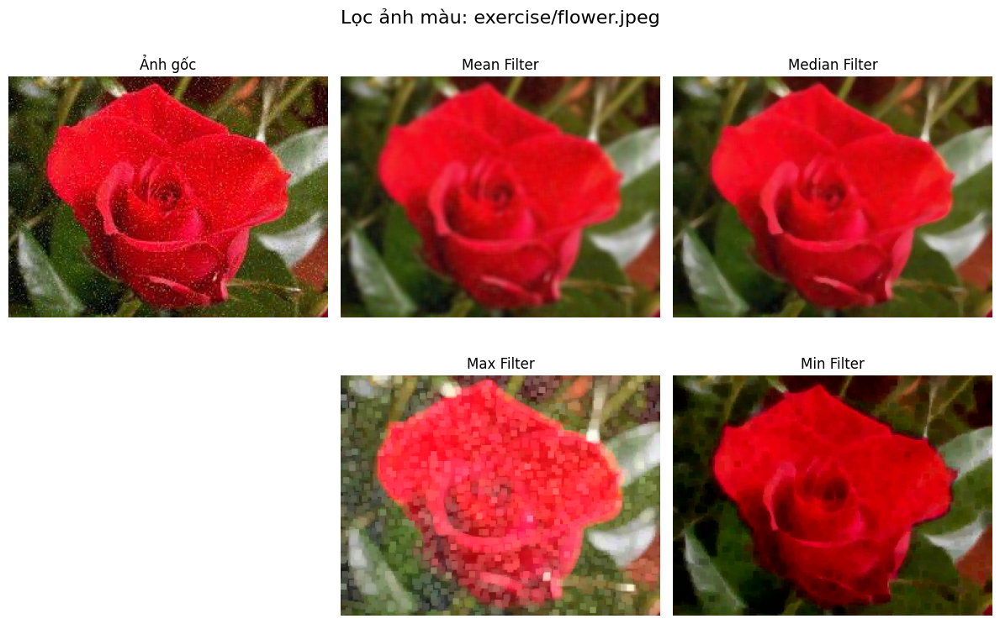

In [15]:
#Bài 6:
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
import matplotlib.pyplot as plt

# Danh sách ảnh cần xử lý
image_files = ['exercise/baby.jpeg', 'exercise/balloons_noisy.png', 'exercise/flower.jpeg']
filter_size = 5

# Duyệt qua từng ảnh
for path in image_files:
    # Đọc ảnh màu
    original = iio.imread(path)

    # Tạo các ảnh sau khi lọc (Mean, Median, Max, Min)
    mean_filtered = np.zeros_like(original)
    median_filtered = np.zeros_like(original)
    max_filtered = np.zeros_like(original)
    min_filtered = np.zeros_like(original)

    # Lọc từng kênh màu
    for c in range(3):  # RGB channels
        mean_filtered[:, :, c] = sn.convolve(original[:, :, c], np.ones((filter_size, filter_size)) / (filter_size**2)).astype(np.uint8)
        median_filtered[:, :, c] = sn.median_filter(original[:, :, c], size=filter_size)
        max_filtered[:, :, c] = sn.maximum_filter(original[:, :, c], size=filter_size)
        min_filtered[:, :, c] = sn.minimum_filter(original[:, :, c], size=filter_size)

    # Hiển thị ảnh
    plt.figure(figsize=(12, 8))
    plt.suptitle(f"Lọc ảnh màu: {path}", fontsize=16)

    plt.subplot(2, 3, 1)
    plt.title("Ảnh gốc")
    plt.imshow(original)
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.title("Mean Filter")
    plt.imshow(mean_filtered)
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.title("Median Filter")
    plt.imshow(median_filtered)
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.title("Max Filter")
    plt.imshow(max_filtered)
    plt.axis('off')

    plt.subplot(2, 3, 6)
    plt.title("Min Filter")
    plt.imshow(min_filtered)
    plt.axis('off')

    plt.tight_layout()
    plt.show()


✅ Đã lưu ảnh biên: exercise/edges_baby.jpeg


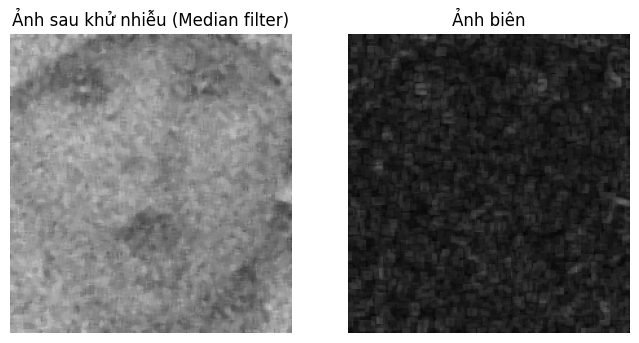

✅ Đã lưu ảnh biên: exercise/edges_balloons_noisy.png


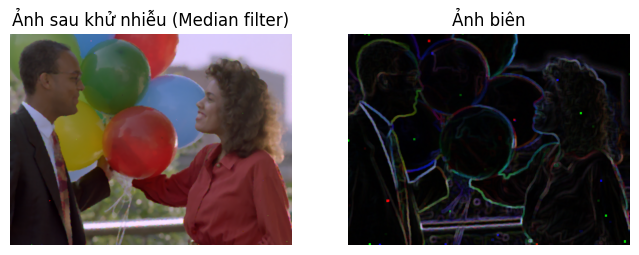

✅ Đã lưu ảnh biên: exercise/edges_flower.jpeg


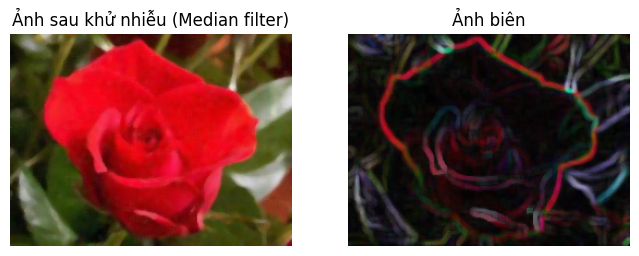

In [32]:
#Bài 7:
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
import matplotlib.pyplot as plt

image_files = ['exercise/baby.jpeg', 'exercise/balloons_noisy.png', 'exercise/flower.jpeg']
filter_size = 5

def detect_edges(img):
    # Sử dụng max filter và min filter để giả lập biên cạnh: biên = max - min
    max_img = np.zeros_like(img)
    min_img = np.zeros_like(img)
    for c in range(3):
        max_img[:,:,c] = sn.maximum_filter(img[:,:,c], size=filter_size).astype(np.uint8)
        min_img[:,:,c] = sn.minimum_filter(img[:,:,c], size=filter_size).astype(np.uint8)
    edges = max_img - min_img
    return edges

for path in image_files:
    img = iio.imread(path).astype(np.uint8)

    # Khử nhiễu với median filter từng kênh
    denoised = np.zeros_like(img)
    for c in range(3):
        denoised[:,:,c] = sn.median_filter(img[:,:,c], size=filter_size).astype(np.uint8)

    # Xác định biên
    edges_img = detect_edges(denoised)

    # Lưu ảnh biên
    output_path = path.replace('exercise/', 'exercise/edges_')
    iio.imwrite(output_path, edges_img)
    print(f"✅ Đã lưu ảnh biên: {output_path}")

    # Hiển thị ảnh
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    plt.title("Ảnh sau khử nhiễu (Median filter)")
    plt.imshow(denoised)
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.title("Ảnh biên")
    plt.imshow(edges_img)
    plt.axis('off')

    plt.show()


✅ Đã lưu ảnh đổi màu RGB ngẫu nhiên: exercise/rgb_random_baby.jpeg


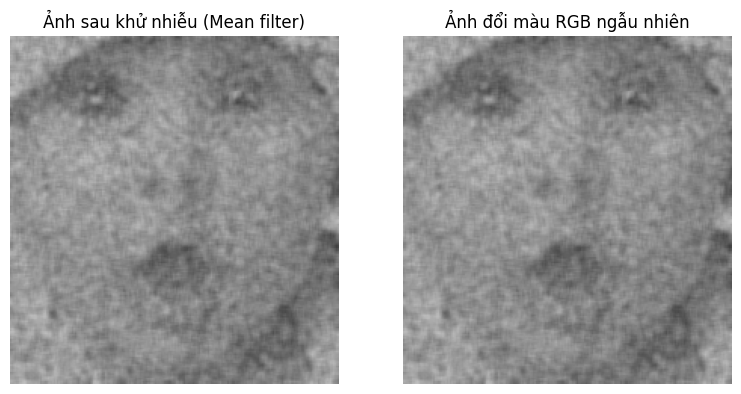

✅ Đã lưu ảnh đổi màu RGB ngẫu nhiên: exercise/rgb_random_balloons_noisy.png


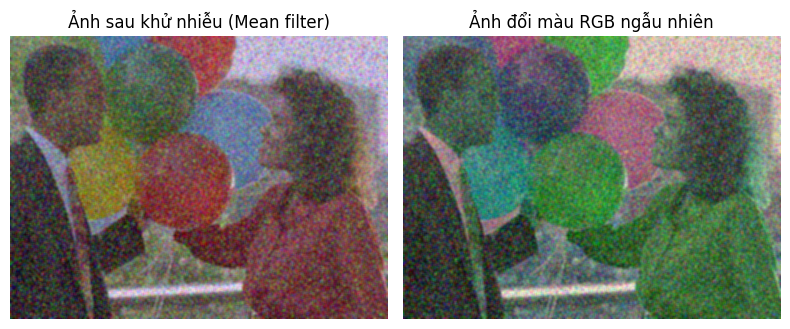

✅ Đã lưu ảnh đổi màu RGB ngẫu nhiên: exercise/rgb_random_flower.jpeg


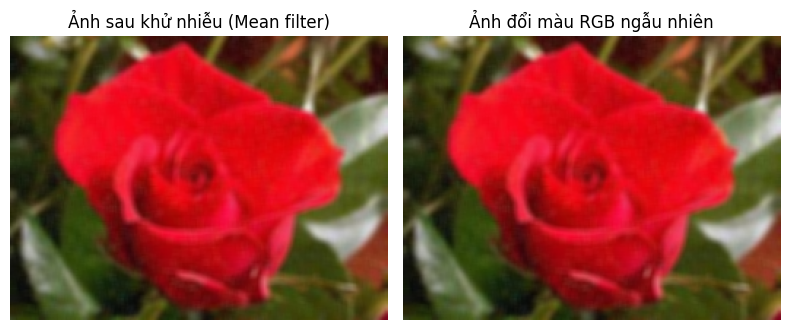

In [29]:
#Bài 8:

import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
import matplotlib.pyplot as plt
import os
import random

# Danh sách ảnh trong thư mục Exercise
image_files = ['exercise/baby.jpeg', 'exercise/balloons_noisy.png', 'exercise/flower.jpeg']

filter_size = 5

for path in image_files:
    # Đọc ảnh
    img = iio.imread(path)

    # Khử nhiễu bằng 4 filter (mean, median, max, min)
    mean_filtered = np.zeros_like(img)
    median_filtered = np.zeros_like(img)
    max_filtered = np.zeros_like(img)
    min_filtered = np.zeros_like(img)
    for c in range(3):
        mean_filtered[:, :, c] = sn.convolve(img[:, :, c], np.ones((filter_size, filter_size)) / (filter_size**2)).astype(np.uint8)
        median_filtered[:, :, c] = sn.median_filter(img[:, :, c], size=filter_size)
        max_filtered[:, :, c] = sn.maximum_filter(img[:, :, c], size=filter_size)
        min_filtered[:, :, c] = sn.minimum_filter(img[:, :, c], size=filter_size)

    # Lấy ảnh sau lọc mean làm ảnh gốc để đổi màu RGB (cũng có thể chọn filter khác nếu muốn)
    filtered_img = mean_filtered.copy()

    # Đổi màu RGB ngẫu nhiên: đổi vị trí kênh RGB (hoán vị ngẫu nhiên)
    channels = [0, 1, 2]
    random.shuffle(channels)  # Hoán vị ngẫu nhiên 3 kênh màu

    rgb_random = np.zeros_like(filtered_img)
    for i, ch in enumerate(channels):
        rgb_random[:, :, i] = filtered_img[:, :, ch]

    # Lưu ảnh mới
    output_path = path.replace('exercise/', 'exercise/rgb_random_')
    iio.imwrite(output_path, rgb_random)
    print(f"✅ Đã lưu ảnh đổi màu RGB ngẫu nhiên: {output_path}")

    # Hiển thị ảnh
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    plt.title("Ảnh sau khử nhiễu (Mean filter)")
    plt.imshow(filtered_img)
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.title("Ảnh đổi màu RGB ngẫu nhiên")
    plt.imshow(rgb_random)
    plt.axis('off')

    plt.tight_layout()
    plt.show()


✅ Đã lưu ảnh đổi màu HSV ngẫu nhiên (thực chất đổi kênh RGB): exercise/hsv_random_baby.jpeg


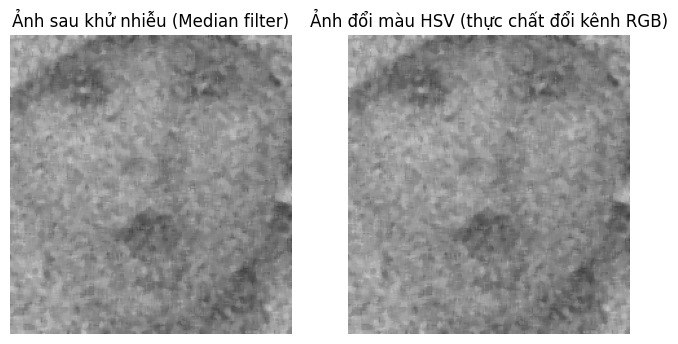

✅ Đã lưu ảnh đổi màu HSV ngẫu nhiên (thực chất đổi kênh RGB): exercise/hsv_random_balloons_noisy.png


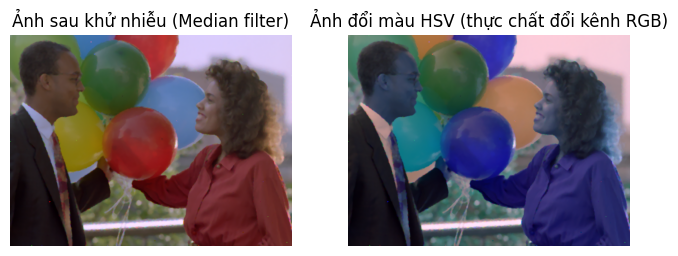

✅ Đã lưu ảnh đổi màu HSV ngẫu nhiên (thực chất đổi kênh RGB): exercise/hsv_random_flower.jpeg


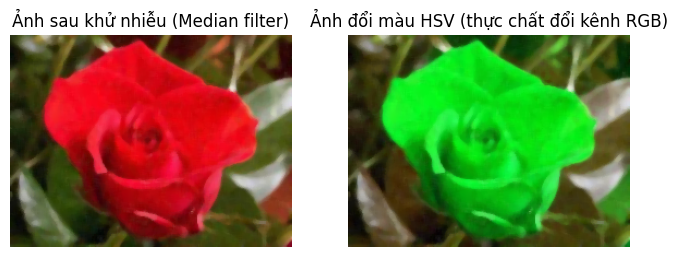

In [28]:
#Bài 9:
import numpy as np
import imageio.v2 as iio
import scipy.ndimage as sn
import matplotlib.pyplot as plt
import random

image_files = ['exercise/baby.jpeg', 'exercise/balloons_noisy.png', 'exercise/flower.jpeg']
filter_size = 5

for path in image_files:
    img = iio.imread(path).astype(np.uint8)

    # Khử nhiễu với median filter
    denoised = np.zeros_like(img)
    for c in range(3):
        denoised[:,:,c] = sn.median_filter(img[:,:,c], size=filter_size).astype(np.uint8)

    # Đổi màu HSV ngẫu nhiên không trùng: thay bằng đổi vị trí 3 kênh RGB (thay đổi thứ tự kênh)
    channels = [0,1,2]
    shuffled = channels.copy()
    while True:
        random.shuffle(shuffled)
        if shuffled != channels:
            break

    rgb_random = np.zeros_like(denoised)
    for i, ch in enumerate(shuffled):
        rgb_random[:,:,i] = denoised[:,:,ch]

    # Lưu ảnh đổi màu
    output_path = path.replace('exercise/', 'exercise/hsv_random_')
    iio.imwrite(output_path, rgb_random)
    print(f"✅ Đã lưu ảnh đổi màu HSV ngẫu nhiên (thực chất đổi kênh RGB): {output_path}")

    # Hiển thị ảnh
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    plt.title("Ảnh sau khử nhiễu (Median filter)")
    plt.imshow(denoised)
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.title("Ảnh đổi màu HSV (thực chất đổi kênh RGB)")
    plt.imshow(rgb_random)
    plt.axis('off')

    plt.show()
